<a href="https://colab.research.google.com/github/CrushedKatana/PCVK/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**PRACTICAL**

## D1. Simple Image Operations




In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import glob

 Mengubah tingkat kecerahan citra 
-----------------------------------
Masukkan nilai kecerahan: 50


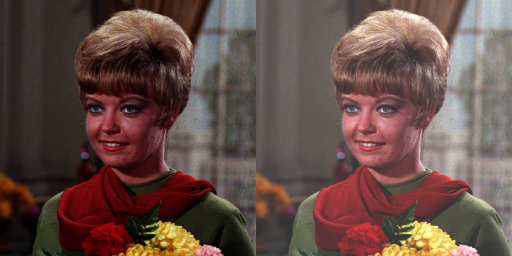

In [6]:
print (' Mengubah tingkat kecerahan citra ')
print('-----------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      # Perform addition in int32 to avoid overflow warning
      brightness_image[y,x,c] = np.clip(original[y,x,c].astype(np.int32) + brightness, 0, 255).astype(original.dtype)


#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original,brightness_image))
cv2_imshow(final_frame)

## D1 PRACTICAL ASSIGNMENT

### 1. Implement image inversion on Google Collaboratory using the formulas found in the Theory Review section, resulting in the following output:

Original ID vs. Inverted ID


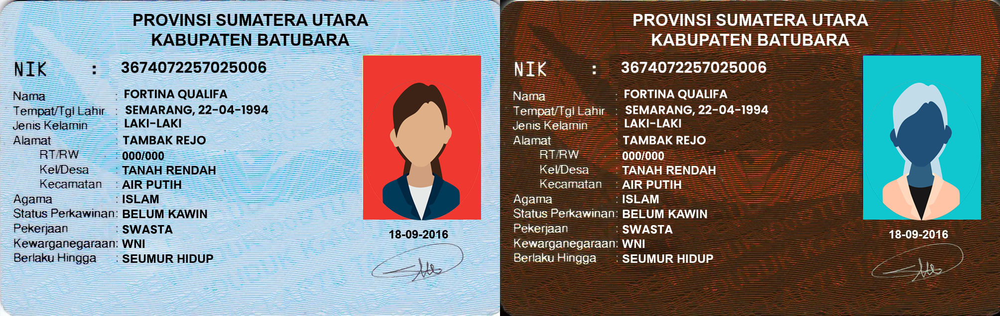

In [7]:
try:
    ktp_image = cv.imread('/content/drive/MyDrive/PCVK/Images/id_card.png')
    if ktp_image is None:
        print("Error: Image 'ktp.jpg' not found.")
    else:
        inverted_image = 255 - ktp_image
        print("Original ID vs. Inverted ID")
        final_frame = cv.hconcat((ktp_image, inverted_image))
        cv2_imshow(final_frame)

except Exception as e:
    print(f"An error occurred: {e}")

### 2. Implement the contrast transformation in Google Collaboratory using the formula found in the Theory Review section for contrast, resulting in the following output:

Masukkan tingkat kecerahan [-255 s/d 255]: 50
Mengubah kontras dan tingkat kecerahan citra
-------------------------------------------
Masukkan kontras [1.0-3.0]: 2


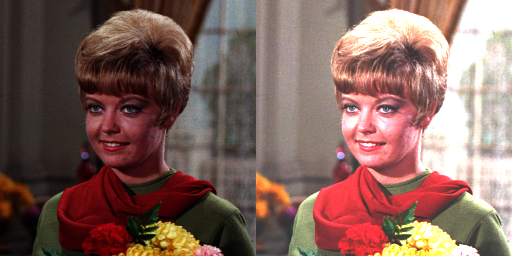

In [8]:
try:
  print('Mengubah kontras dan tingkat kecerahan citra')
  print('-------------------------------------------')

  try:
      brightness = int(input('Masukkan tingkat kecerahan [-255 s/d 255]: '))
      contrast = float(input('Masukkan kontras [1.0-3.0]: '))
  except ValueError:
      print('Error, input tidak valid')

  original = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff')

  contrast_image = cv.convertScaleAbs(original, alpha=contrast, beta=brightness)

  final_frame = cv.hconcat((original, contrast_image))
  cv2_imshow(final_frame)
except Exception as e:
  print(f"An error occurred: {e}")

### 3. Implement the logarithmic brightness transformation in Google Collaboratory using the formula found in the Theory Review section for log transformation, resulting in the following output:

Mengubah tingkat kecerahan citra dengan Transformasi Log
----------------------------------------------------
Masukkan nilai kecerahan: 50


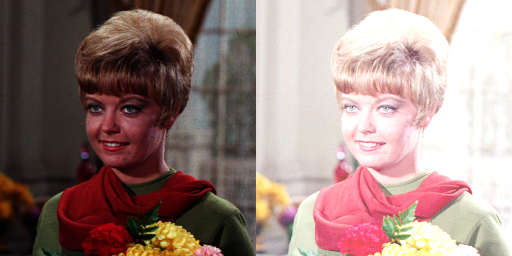

In [9]:
# --- Logarithmic Brightness Transformation ---
print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
print('----------------------------------------------------')

try:
    brightness_add = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

path_image = '/content/drive/MyDrive/PCVK/Images/female.tiff'
original = cv.imread(path_image)

if original is None:
    print(f"ERROR: Gambar tidak ditemukan di path: {path_image}")
    print("Pastikan path sudah benar dan Google Drive telah terhubung.")
else:
    c = 255 / np.log(1 + np.max(original))
    log_image = c * (np.log(original + 1))

    log_image_bright = np.clip(log_image + brightness_add, 0, 255)

    log_image_bright = np.array(log_image_bright, dtype=np.uint8)

    final_frame = cv.hconcat((original, log_image_bright))
    cv2_imshow(final_frame)

### 4. Implement the grayscale transformation using the averaging, lightness, and luminance methods on Google Collaboratory using the formulas found in the Theory Review section, resulting in the following output:

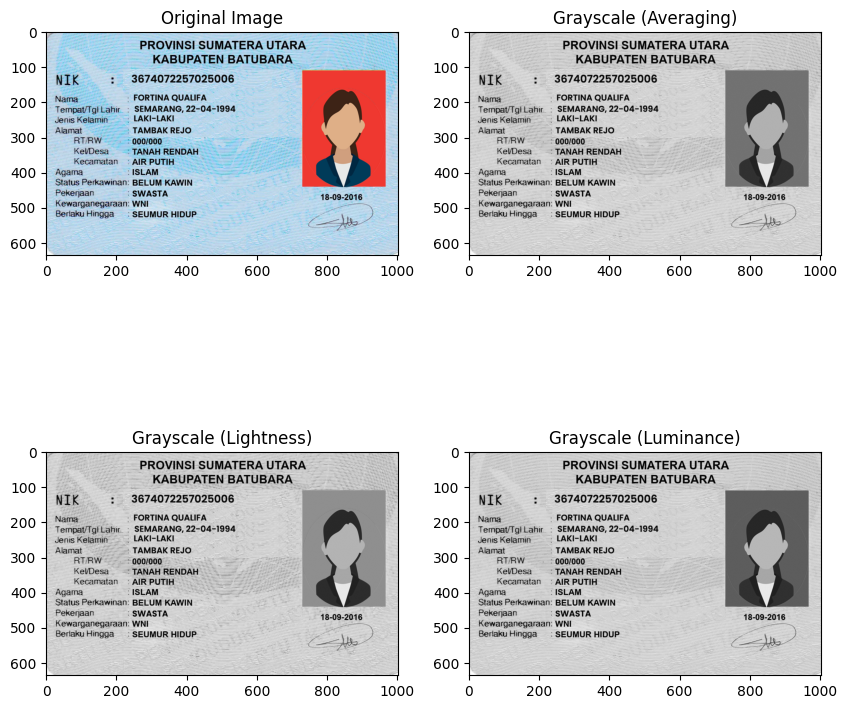

In [10]:
# Load the color image
img = cv.imread('/content/drive/MyDrive/PCVK/Images/id_card.png')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB) # Convert for matplotlib

# Split into R, G, B channels
R, G, B = img_rgb[:,:,0], img_rgb[:,:,1], img_rgb[:,:,2]

# --- a. Averaging Method ---
# Grayscale_avg = (R + G + B) / 3 [cite: 88]
gray_avg = (R.astype(float) + G.astype(float) + B.astype(float)) / 3
gray_avg = gray_avg.astype(np.uint8)

# --- b. Lightness Method ---
# Grayscale_lightness = (max(R,G,B) + min(R,G,B)) / 2 [cite: 88]
max_c = np.maximum(np.maximum(R, G), B)
min_c = np.minimum(np.minimum(R, G), B)
gray_lightness = ((max_c.astype(float) + min_c.astype(float)) / 2).astype(np.uint8)

# --- c. Luminance Method ---
# Grayscale_luminance = 0.21R + 0.72G + 0.07B [cite: 88]
gray_luminance = (0.21 * R + 0.72 * G + 0.07 * B).astype(np.uint8)


# --- Display Results ---
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

axs[0, 0].imshow(img_rgb)
axs[0, 0].set_title('Original Image')

axs[0, 1].imshow(gray_avg, cmap='gray')
axs[0, 1].set_title('Grayscale (Averaging)')

axs[1, 0].imshow(gray_lightness, cmap='gray')
axs[1, 0].set_title('Grayscale (Lightness)')

axs[1, 1].imshow(gray_luminance, cmap='gray')
axs[1, 1].set_title('Grayscale (Luminance)')

plt.show()

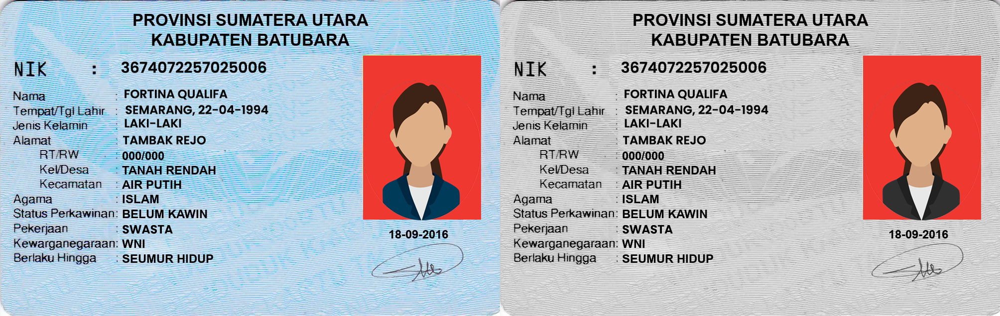

In [11]:
image = cv.imread('/content/drive/MyDrive/PCVK/Images/id_card.png')
output_image = image.copy()

height, width, _ = image.shape

for y in range(height):
    for x in range(width):
        b, g, r = image[y, x]
        if r > g and r > b:
            pass
        else:
            gray_val = int(0.21 * r + 0.72 * g + 0.07 * b)
            output_image[y, x] = [gray_val, gray_val, gray_val]

final_frame = cv.hconcat((image, output_image))
cv2_imshow(final_frame)

# D2: Arithmetic and Logical Operation (Assignments)


### 1. Make Gamma Correction according to the following

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


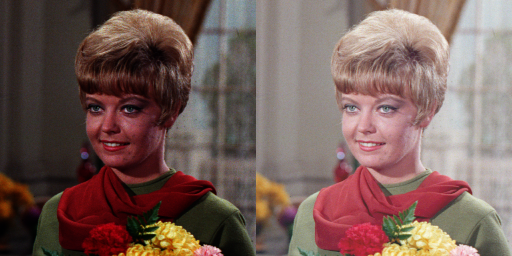

In [19]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# --- Gamma Correction ---
print(' Gamma Correction pada citra ')
print('----------------------------------')

try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')

path_image = '/content/drive/MyDrive/PCVK/Images/female.tiff'
original = cv.imread(path_image)

if original is None:
    print(f"ERROR: Image not found at path: {path_image}")
    print("Please ensure the path is correct and Google Drive is mounted.")
else:
    if gamma == 0:
      print("Gamma cannot be zero.")
    else:
      invGamma = 1.0 / gamma
      table = np.array([((i / 255.0) ** invGamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")

      gamma_corrected_image = cv.LUT(original, table)

      final_frame = cv.hconcat((original, gamma_corrected_image))
      cv2_imshow(final_frame)

### 2. Create Image Depth Simulation

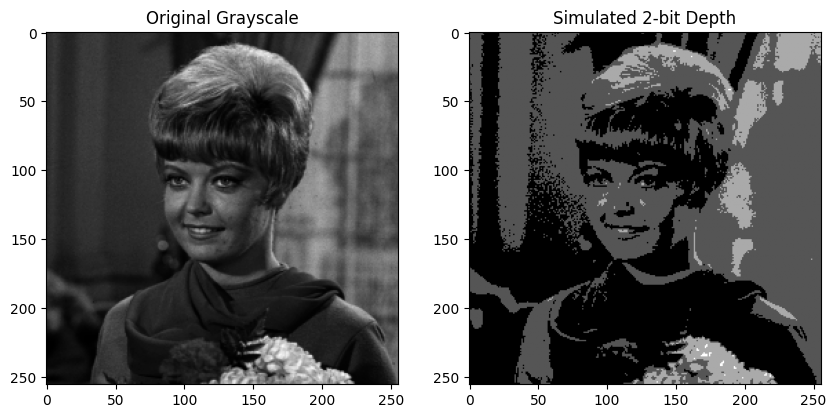

In [21]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

bit_depth = 2

original = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff', cv.IMREAD_GRAYSCALE)

if original is None:
    print("Error: Image not found. Please check the path and ensure Google Drive is mounted.")
else:
    level = 255 / (pow(2, bit_depth) - 1)

    quantized_image = np.round(original / level) * level
    quantized_image = quantized_image.astype(np.uint8)

    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].imshow(original, cmap='gray')
    axs[0].set_title('Original Grayscale')

    axs[1].imshow(quantized_image, cmap='gray')
    axs[1].set_title(f'Simulated {bit_depth}-bit Depth')

    plt.show()

### 3. Average Denoising

--- PSNR Results ---
Num Images | PSNR (dB)
--------------------
        10 | 19.74
        20 | 19.84
        40 | 19.89
        80 | 19.92
       100 | 19.92


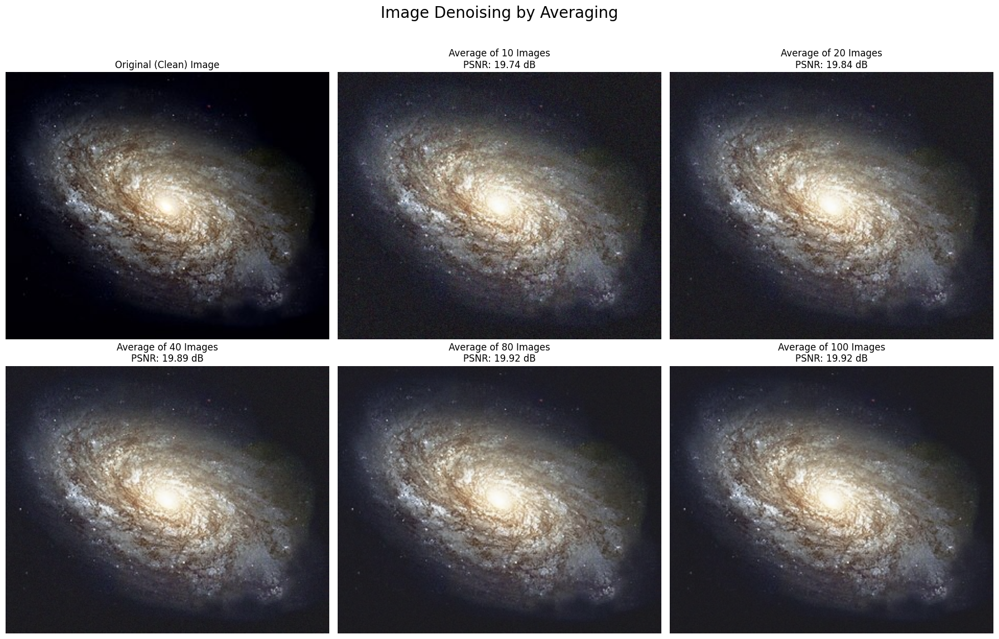

In [30]:
# --- PSNR Function ---
def PSNR(original, compressed):
    mse = np.mean((original.astype("float") - compressed.astype("float")) ** 2)
    if mse == 0:
        return 100
    max_pixel = 255.0
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr


path_original = '/content/drive/MyDrive/PCVK/Images/galaxy.jpg'
original_galaxy = cv.imread(path_original)


noisy_image_paths = glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg')

if original_galaxy is None or not noisy_image_paths:
    print("Error loading images. Please check your file paths:")
    print(f"Original image path: {path_original}")
    print(f"Noisy images path: /content/drive/MyDrive/PCVK/Images/noises/*.jpg")
else:
    noisy_image_paths.sort()

    noisy_images = [cv.imread(img_path) for img_path in noisy_image_paths]

    average_counts = [10, 20, 40, 80, 100]

    result_images = []
    result_psnr = []

    print("--- PSNR Results ---")
    print("Num Images | PSNR (dB)")
    print("--------------------")

    for count in average_counts:
        images_to_average = noisy_images[:count]

        avg_image_accumulator = np.zeros(original_galaxy.shape, np.float64)
        for img in images_to_average:
            avg_image_accumulator += img

        avg_image = (avg_image_accumulator / count).astype(np.uint8)
        result_images.append(avg_image)

        psnr_value = PSNR(original_galaxy, avg_image)
        result_psnr.append(psnr_value)

        print(f"{count:10d} | {psnr_value:.2f}")

    # --- Display all results using Matplotlib for better comparison ---
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle('Image Denoising by Averaging', fontsize=20)
    axes = axes.ravel()

    # 1. Display Original Image
    axes[0].imshow(cv.cvtColor(original_galaxy, cv.COLOR_BGR2RGB))
    axes[0].set_title("Original (Clean) Image")
    axes[0].axis('off')

    # 2. Display the Denoised Images
    for i, (img, count, psnr) in enumerate(zip(result_images, average_counts, result_psnr)):
        ax = axes[i + 1]
        ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
        ax.set_title(f"Average of {count} Images\nPSNR: {psnr:.2f} dB")
        ax.axis('off')

    # Hide any unused subplots
    if len(axes) > len(result_images) + 1:
        for i in range(len(result_images) + 1, len(axes)):
            axes[i].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


Conclusion: Based on the results, you will observe that as the number of images used in the averaging process increases, the PSNR value also increases. This indicates that the noise is more effectively reduced, and the resulting image quality is closer to the original, clean image.

### 4. Image Masking

--- Input Image and Canvas (Mask) ---


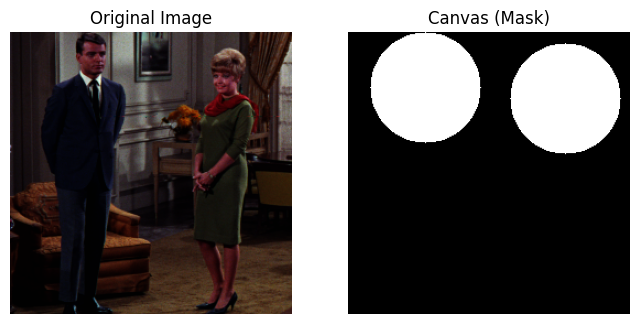

In [46]:
# Load the original image and convert from BGR to RGB for matplotlib
# IMPORTANT: Change this path to your file's location in Google Drive
img_path = '/content/drive/MyDrive/PCVK/Images/couple.tiff'
img_couple = cv.cvtColor(cv.imread(img_path), cv.COLOR_BGR2RGB)

# Create a black canvas (mask) with the same height and width
canvas = np.zeros((img_couple.shape[0], img_couple.shape[1]), dtype=np.uint8)

# Define and draw two white circles on the canvas
# These are the new coordinates and radius from your example
cv.circle(canvas, center=(70, 50), radius=50, color=255, thickness=-1)
cv.circle(canvas, center=(197, 60), radius=50, color=255, thickness=-1)

# Display the inputs for reference
print("--- Input Image and Canvas (Mask) ---")
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(img_couple)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(canvas, cmap='gray')
plt.title('Canvas (Mask)')
plt.axis('off')
plt.show()

NOT

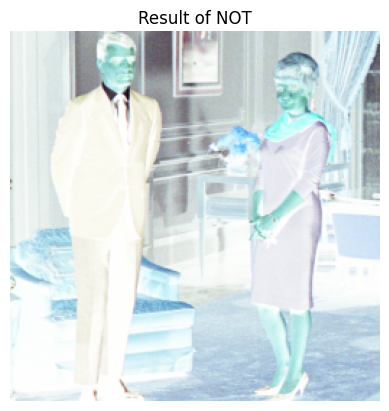

In [51]:
# Apply the bitwise NOT operation
result_not = cv.bitwise_not(img_couple)

plt.imshow(result_not)
plt.title('Result of NOT')
plt.axis('off')
plt.show()

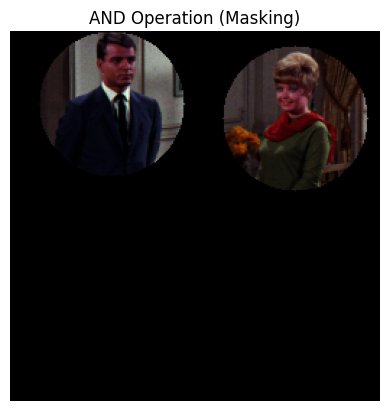

In [52]:
# Apply the AND operation, restricted by the canvas
result_and = cv.bitwise_and(img_couple, img_couple, mask=canvas)

# Display the result
plt.imshow(result_and)
plt.title('AND Operation (Masking)')
plt.axis('off')
plt.show()

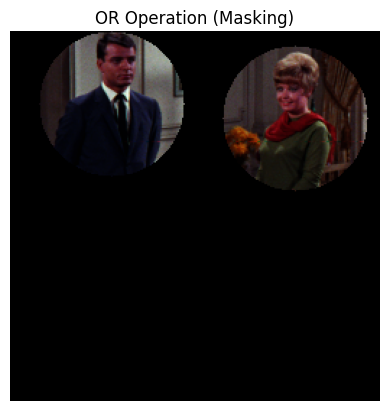

In [53]:
# Apply the OR operation, restricted by the canvas
result_or = cv.bitwise_or(img_couple, img_couple, mask=canvas)

# Display the result
plt.imshow(result_or)
plt.title('OR Operation (Masking)')
plt.axis('off')
plt.show()

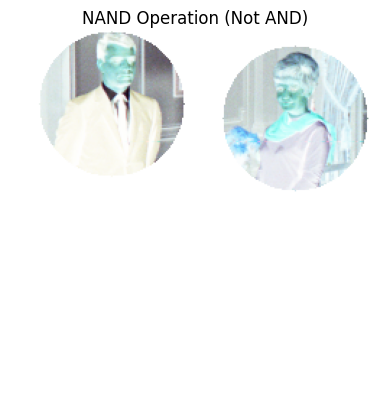

In [54]:
# First, perform the AND operation as above
result_and = cv.bitwise_and(img_couple, img_couple, mask=canvas)
# Now, apply the NOT operation to the AND result
result_nand = cv.bitwise_not(result_and)

# Display the result
plt.imshow(result_nand)
plt.title('NAND Operation (Not AND)')
plt.axis('off')
plt.show()

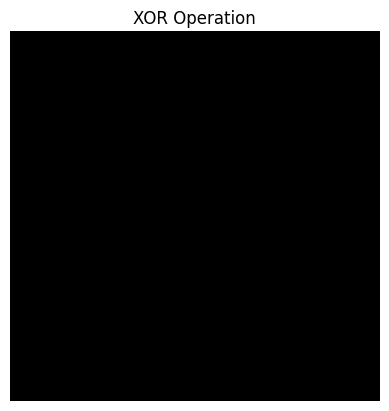

In [55]:
# Apply the XOR operation, restricted by the canvas
result_xor = cv.bitwise_xor(img_couple, img_couple, mask=canvas)

# Display the result
plt.imshow(result_xor)
plt.title('XOR Operation')
plt.axis('off')
plt.show()

## Analysis:
* NOT: Operasi ini melakukan inversi atau pembalikan nilai pada setiap piksel. Piksel putih (255) akan diubah menjadi hitam (0), dan sebaliknya. Operasi ini secara efektif menghasilkan citra negatif dari mask.

* OR: Operasi ini akan menghasilkan piksel putih (255) jika piksel pada citra asli atau piksel pada mask bernilai putih. Akibatnya, area citra yang bertepatan dengan mask putih akan menjadi putih sepenuhnya, menutupi citra asli. Sementara itu, area yang bertepatan dengan mask hitam akan mempertahankan citra aslinya.

* AND: Operasi ini merupakan metode fundamental untuk masking (penopengan) guna menyeleksi Region of Interest (ROI). Operasi AND hanya akan menampilkan bagian dari citra asli yang bertepatan dengan area putih pada mask. Seluruh area lain di luar ROI akan diubah menjadi hitam (0).

* NAND (Not AND): Operasi ini adalah inversi dari hasil operasi AND. Hasil dari operasi AND akan dibalik nilainya menggunakan operasi NOT. Hal ini menyebabkan latar belakang yang semula hitam menjadi putih, dan konten citra di dalam ROI menjadi citra negatif.

* XOR (Exclusive OR): Operasi ini akan menghasilkan nilai berdasarkan perbedaan antara dua input. Pada area yang bertepatan dengan mask putih, piksel citra asli akan diinversi menjadi citra negatif. Sebaliknya, pada area yang bertepatan dengan mask hitam, piksel citra asli tidak akan mengalami perubahan.